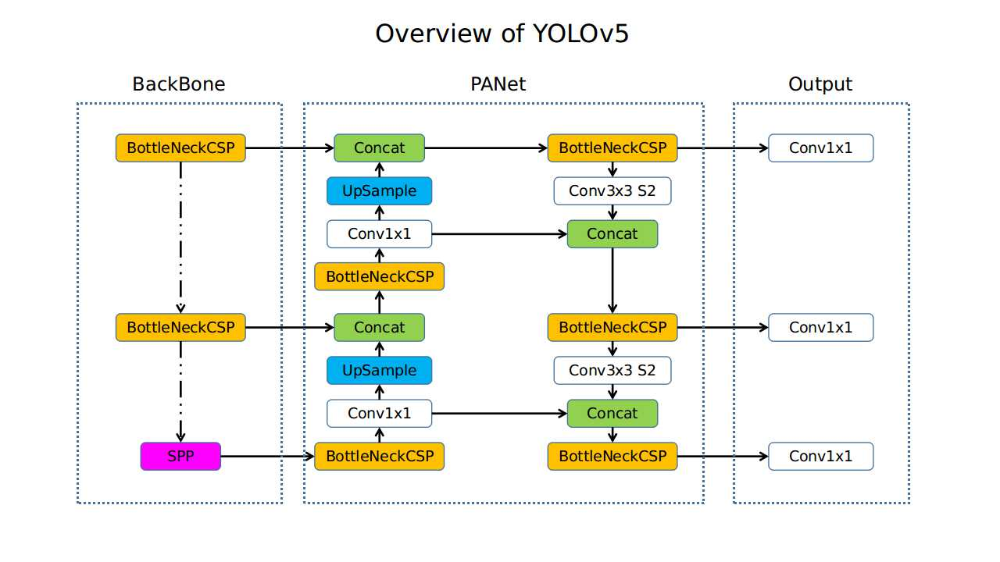

# **Download YOLO V5 and dataset**

In [ ]:
!git clone https://github.com/roozbehrajabi/ALPR_Dataset.git
!git clone https://github.com/ultralytics/yolov5
!pip install dill
!pip install -U -r yolov5/requirements.txt

Cloning into 'ALPR_Dataset'...
remote: Enumerating objects: 8947, done.
remote: Total 8947 (delta 0), reused 0 (delta 0), pack-reused 8947
Receiving objects: 100% (8947/8947), 234.00 MiB | 43.35 MiB/s, done.
Resolving deltas: 100% (1646/1646), done.
Updating files: 100% (8969/8969), done.
Cloning into 'yolov5'...
remote: Enumerating objects: 16656, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 16656 (delta 1), reused 5 (delta 0), pack-reused 16649
Receiving objects: 100% (16656/16656), 15.07 MiB | 28.11 MiB/s, done.
Resolving deltas: 100% (11443/11443), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 41.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Copy the following lines in data/VOC.yaml to config the model.

train: /content/data/images/

val: /content/data/images/

test: /content/data/images/


nc: 1


names: ['plate']


# **Loading dataset**

In [ ]:
import os

if not os.path.exists('data'):
    for folder in ['images', 'labels']:
        for split in ['train', 'val','test']:
            os.makedirs(f'data/{folder}/{split}')

In [ ]:
os.rename("/content/ALPR_Dataset/YOLOv3_Dataset/Train", "/content/ALPR_Dataset/YOLOv3_Dataset/train")
os.rename("/content/ALPR_Dataset/YOLOv3_Dataset/Test", "/content/ALPR_Dataset/YOLOv3_Dataset/val")
os.rename("/content/ALPR_Dataset/YOLOv3_Dataset/train/1input", "/content/ALPR_Dataset/YOLOv3_Dataset/train/input")
os.rename("/content/ALPR_Dataset/YOLOv3_Dataset/train/1output", "/content/ALPR_Dataset/YOLOv3_Dataset/train/output")

In [ ]:
import shutil
import os


###Load train
li=os.listdir("/content/ALPR_Dataset/YOLOv3_Dataset/train/input")
for image_name in li:
    label_name = image_name.replace('.jpg', '.txt')
    source_image_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/train/input/{image_name}'
    source_label_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/train/output/YOLO_darknet/{label_name}'

    shutil.copy(source_image_path, 'data/images/train')
    shutil.copy(source_label_path, 'data/labels/train')



####Load validation set
li=os.listdir("/content/ALPR_Dataset/YOLOv3_Dataset/val/input")
for image_name in li[0:len(li)//2]:
    label_name = image_name.replace('.jpg', '.txt')
    source_image_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/val/input/{image_name}'
    source_label_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/val/output/YOLO_darknet/{label_name}'

    shutil.copy(source_image_path, 'data/images/val')
    shutil.copy(source_label_path, 'data/labels/val')



###Load test set
li=os.listdir("/content/ALPR_Dataset/YOLOv3_Dataset/val/input")
for image_name in li[len(li)//2:]:
    label_name = image_name.replace('.jpg', '.txt')
    source_image_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/val/input/{image_name}'
    source_label_path = f'/content/ALPR_Dataset/YOLOv3_Dataset/val/output/YOLO_darknet/{label_name}'

    shutil.copy(source_image_path, 'data/images/test')
    shutil.copy(source_label_path, 'data/labels/test')




# **Start trainig the model**

In [ ]:
!python yolov5/train.py --data VOC.yaml --weights yolov5s.pt --epochs 10 --batch 64 --freeze 10

2024-05-31 10:08:37.748645: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-31 10:08:37.748702: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-31 10:08:37.754698: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=VOC.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5/data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls

In [ ]:
!cp -r /content/yolov5/runs/train/exp2 "/content/drive/MyDrive/"

In [ ]:
from PIL import Image
Image.open("/content/yolov5/runs/train/exp2/results.png")

# **Evaluation**

In [ ]:
!python yolov5/val.py --weights /content/drive/MyDrive/exp2/weights/best.pt --data VOC.yaml

val: data=/content/yolov5/data/VOC.yaml, weights=['/content/drive/MyDrive/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-318-gc0380fd8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
100% 755k/755k [00:00<00:00, 23.2MB/s]
val: Scanning /content/data/labels/test... 2840 images, 0 backgrounds, 0 corrupt: 100% 2840/2840 [00:03<00:00, 874.42it/s] 
val: New cache created: /content/data/labels/test.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 89/89 [00:54<00:00,  1.62it/s]
                   all       2840       3011      0.971      0.978      0.993       0

In [ ]:
!cp -r /content/yolov5/runs/val/exp "/content/drive/MyDrive/val"

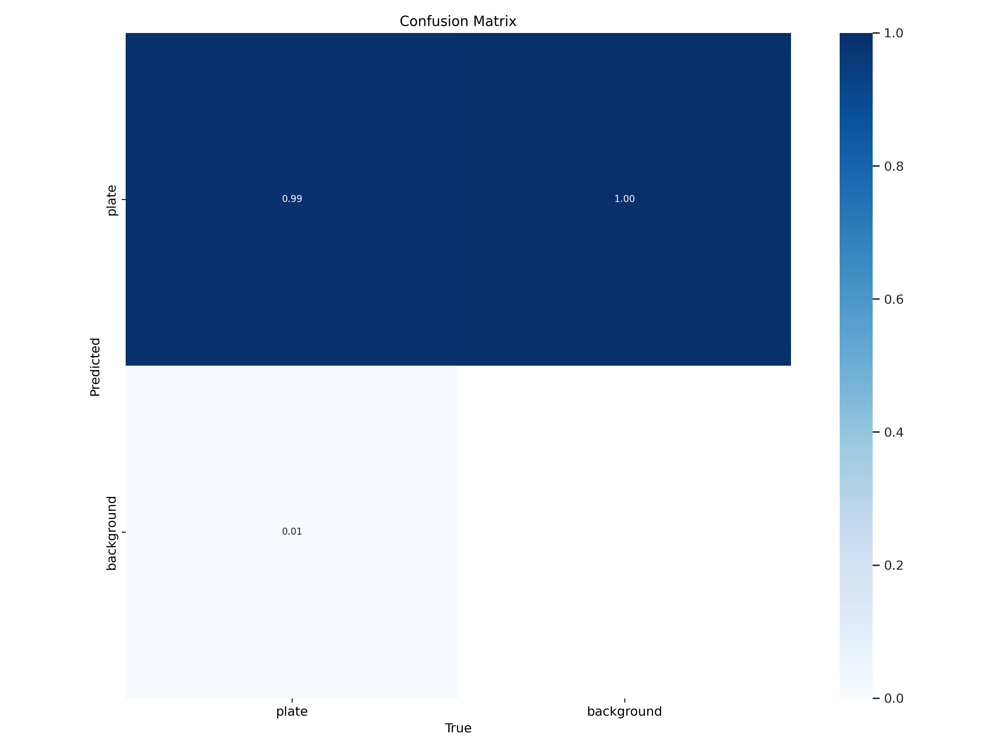

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

path="/content/drive/MyDrive/exp2/confusion_matrix.png"
image = cv2.imread(path)
cv2_imshow(image)

**Prediction of model on some of test samples**

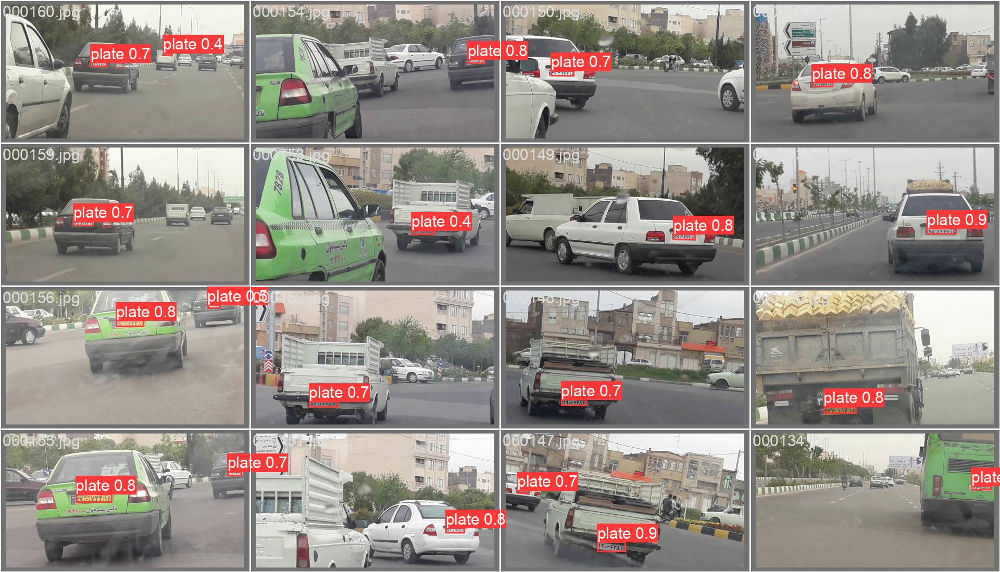

In [ ]:
path="/content/yolov5/runs/val/exp2/val_batch2_pred.jpg"
image = cv2.imread(path)
cv2_imshow(image)

In [ ]:
path="/content/yolov5/runs/val/exp2/val_batch0_pred.jpg"
image = cv2.imread(path)
cv2_imshow(image)

# **Run on a single image**

In [ ]:
!git clone https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt
!pip install dill
!git clone https://github.com/roozbehrajabi/ALPR_Dataset.git

In [ ]:
%cd yolov5
import csv
import os
import platform
import sys
from pathlib import Path

import torch

FILE = Path("/content").resolve()
ROOT = FILE.parents[0]  # YOLOv5 root directory
if str(ROOT) not in sys.path:
    sys.path.append(str(ROOT))  # add ROOT to PATH
ROOT = Path(os.path.relpath(ROOT, Path.cwd()))  # relative

from ultralytics.utils.plotting import Annotator, colors, save_one_box

from models.common import DetectMultiBackend
from utils.dataloaders import IMG_FORMATS, VID_FORMATS, LoadImages, LoadScreenshots, LoadStreams
from utils.general import (
    LOGGER,
    Profile,
    check_file,
    check_img_size,
    check_imshow,
    check_requirements,
    colorstr,
    cv2,
    increment_path,
    non_max_suppression,
    print_args,
    scale_boxes,
    strip_optimizer,
    xyxy2xywh,
)
from utils.torch_utils import select_device, smart_inference_mode


@smart_inference_mode()
def run(
    weights=ROOT / "yolov5s.pt",  # model path or triton URL
    source=ROOT / "data/images",  # file/dir/URL/glob/screen/0(webcam)
    data=ROOT / "data/coco128.yaml",  # dataset.yaml path
    imgsz=(640, 640),  # inference size (height, width)
    conf_thres=0.25,  # confidence threshold
    iou_thres=0.45,  # NMS IOU threshold
    max_det=1000,  # maximum detections per image
    device="",  # cuda device, i.e. 0 or 0,1,2,3 or cpu
    view_img=False,  # show results
    save_txt=False,  # save results to *.txt
    save_csv=False,  # save results in CSV format
    save_conf=False,  # save confidences in --save-txt labels
    save_crop=False,  # save cropped prediction boxes
    nosave=False,  # do not save images/videos
    classes=None,  # filter by class: --class 0, or --class 0 2 3
    agnostic_nms=False,  # class-agnostic NMS
    augment=False,  # augmented inference
    visualize=False,  # visualize features
    update=False,  # update all models
    project=ROOT / "runs/detect",  # save results to project/name
    name="exp",  # save results to project/name
    exist_ok=False,  # existing project/name ok, do not increment
    line_thickness=3,  # bounding box thickness (pixels)
    hide_labels=False,  # hide labels
    hide_conf=False,  # hide confidences
    half=False,  # use FP16 half-precision inference
    dnn=False,  # use OpenCV DNN for ONNX inference
    vid_stride=1,  # video frame-rate stride
):
    source = str(source)
    save_img = not nosave and not source.endswith(".txt")  # save inference images
    is_file = Path(source).suffix[1:] in (IMG_FORMATS + VID_FORMATS)
    is_url = source.lower().startswith(("rtsp://", "rtmp://", "http://", "https://"))
    webcam = source.isnumeric() or source.endswith(".streams") or (is_url and not is_file)
    screenshot = source.lower().startswith("screen")
    if is_url and is_file:
        source = check_file(source)  # download

    # Directories
    save_dir = increment_path(Path(project) / name, exist_ok=exist_ok)  # increment run
    (save_dir / "labels" if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Load model
    device = select_device(device)
    model = DetectMultiBackend(weights, device=device, dnn=dnn, data=data, fp16=half)
    stride, names, pt = model.stride, model.names, model.pt
    imgsz = check_img_size(imgsz, s=stride)  # check image size

    # Dataloader
    bs = 1  # batch_size
    if webcam:
        view_img = check_imshow(warn=True)
        dataset = LoadStreams(source, img_size=imgsz, stride=stride, auto=pt, vid_stride=vid_stride)
        bs = len(dataset)
    elif screenshot:
        dataset = LoadScreenshots(source, img_size=imgsz, stride=stride, auto=pt)
    else:
        dataset = LoadImages(source, img_size=imgsz, stride=stride, auto=pt, vid_stride=vid_stride)
    vid_path, vid_writer = [None] * bs, [None] * bs

    # Run inference
    model.warmup(imgsz=(1 if pt or model.triton else bs, 3, *imgsz))  # warmup
    seen, windows, dt = 0, [], (Profile(device=device), Profile(device=device), Profile(device=device))
    for path, im, im0s, vid_cap, s in dataset:
        with dt[0]:
            im = torch.from_numpy(im).to(model.device)
            im = im.half() if model.fp16 else im.float()  # uint8 to fp16/32
            im /= 255  # 0 - 255 to 0.0 - 1.0
            if len(im.shape) == 3:
                im = im[None]  # expand for batch dim
            if model.xml and im.shape[0] > 1:
                ims = torch.chunk(im, im.shape[0], 0)

        # Inference
        with dt[1]:
            visualize = increment_path(save_dir / Path(path).stem, mkdir=True) if visualize else False
            if model.xml and im.shape[0] > 1:
                pred = None
                for image in ims:
                    if pred is None:
                        pred = model(image, augment=augment, visualize=visualize).unsqueeze(0)
                    else:
                        pred = torch.cat((pred, model(image, augment=augment, visualize=visualize).unsqueeze(0)), dim=0)
                pred = [pred, None]
            else:
                pred = model(im, augment=augment, visualize=visualize)
        # NMS
        with dt[2]:
            pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

        # Process predictions
        plates=[]
        total_anchors=[]
        for i, det in enumerate(pred):  # per image
            seen += 1
            if webcam:  # batch_size >= 1
                p, im0, frame = path[i], im0s[i].copy(), dataset.count
                s += f"{i}: "
            else:
                p, im0, frame = path, im0s.copy(), getattr(dataset, "frame", 0)

            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_boxes(im.shape[2:], det[:, :4], im0.shape).round()

                # Print results
                for c in det[:, 5].unique():
                    n = (det[:, 5] == c).sum()  # detections per class
                    s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                # Write results
                for *xyxy, conf, cls in reversed(det):
                    c = int(cls)  # integer class
                    label = names[c] if hide_conf else f"{names[c]}"
                    confidence = float(conf)
                    anchors=[int(j) for j in xyxy ]
                    if confidence>0.5:
                        plates.append(im0[anchors[1]:anchors[3],anchors[0]:anchors[2],:])
                        total_anchors.append(anchors)
        return plates,total_anchors


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Saving 171071216.jpg to 171071216.jpg


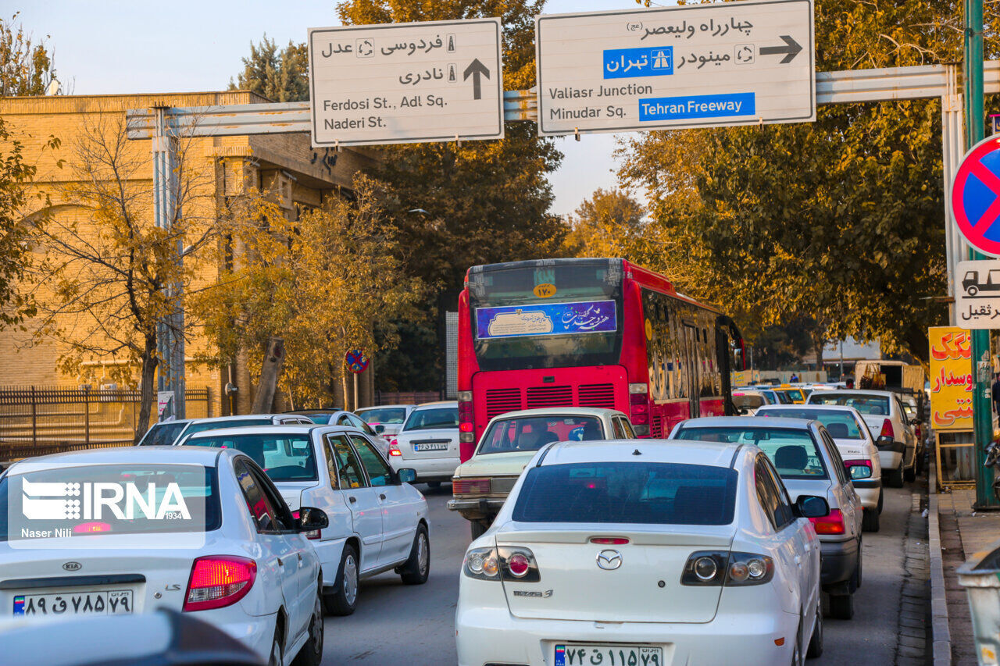

YOLOv5 🚀 v7.0-318-gc0380fd8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs


Analyzing the image...


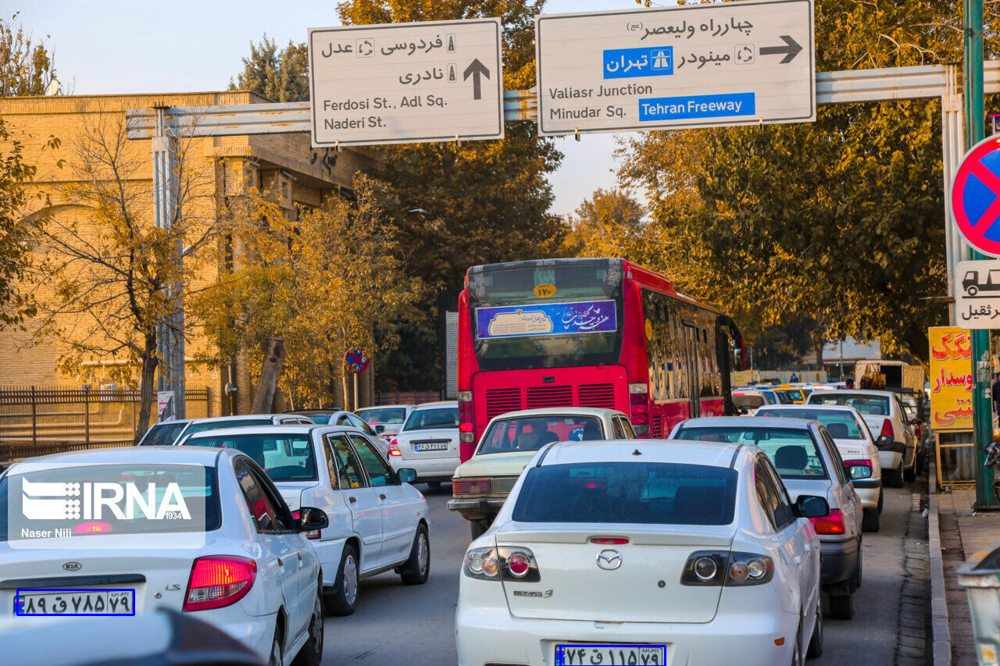

In [ ]:
from google.colab.patches import cv2_imshow
from PIL import Image
import cv2
from google.colab import files
uploaded = files.upload()

path=list(uploaded.keys())[0]
image = cv2.imread(path)
cv2_imshow(image)
im,anchors=run(weights="/content/drive/MyDrive/exp2/weights/best.pt", source=path)
print("Analyzing the image...")

for anchor in anchors:
  start_point = (anchor[0],anchor[1])
  end_point = (anchor[2],anchor[3])
  color = (255, 0, 0)
  thickness = 2
  image = cv2.rectangle(image, start_point, end_point, color, thickness)

cv2_imshow(image)

